In [20]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

label = pd.read_pickle("./ground_truth.pkl")
label2 = label.iloc[:1000,:]
# display(dataframe.describe())
display(label2.head())
display(label2.info())




,x,y,category
0,1,1,trees
1,1,2,trees
2,1,3,water
3,1,4,water
4,1,5,water


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   x         1000 non-null   int64 
 1   y         1000 non-null   int64 
 2   category  1000 non-null   object
dtypes: int64(2), object(1)
memory usage: 23.6+ KB


None

In [21]:
feature = pd.read_pickle("./spectral_data.pkl")
feature2 = feature.iloc[:1000,:]
display(feature2.info())
# display(spectral.describe())
feature2.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Columns: 193 entries, x to 191
dtypes: int16(191), int64(2)
memory usage: 388.8 KB


None

band,x,y,1,2,3,4,5,6,7,8,...,182,183,184,185,186,187,188,189,190,191
0,1,1,3007,2785,2709,2751,2612,2633,2559,2372,...,0,1,1,0,0,0,-1,3,0,0
1,1,2,3328,3151,3078,3012,3040,2903,2769,2598,...,1,1,1,1,0,0,0,1,0,0
2,1,3,3229,3243,3067,3040,3016,2948,2829,2611,...,2,2,0,1,0,0,3,-1,0,1
3,1,4,3250,3186,3049,3036,2949,2936,2823,2586,...,1,1,0,1,1,1,0,0,1,2
4,1,5,3082,3141,3010,3056,3018,2976,2869,2654,...,1,0,1,0,0,1,0,2,0,0


In [22]:
# combined = pd.concat([ground, spectral], axis=1)
# display(combined.head(100))

#
# from sklearn.svm import l1_min_c
# import numpy as np
#
# cs = l1_min_c(feature, label, loss='log') * np.logspace(0, 7, 16)

#
from sklearn.linear_model import LogisticRegression

base_log_reg = LogisticRegression(penalty='l1',
                                  multi_class='ovr',
                                  solver='saga',
                                  max_iter=int(1e4),
                                  C=1).fit(feature2, label2['category'])
#
base_log_reg.score(feature2, label2['category'])

0.92

In [23]:
from sklearn.svm import l1_min_c
import numpy as np

cs = l1_min_c(feature2, label2['category'], loss='log') * np.logspace(0, 7, 16)
np.log10(1/cs)

array([ 6.24309872,  5.77643205,  5.30976539,  4.84309872,  4.37643205,
        3.90976539,  3.44309872,  2.97643205,  2.50976539,  2.04309872,
        1.57643205,  1.10976539,  0.64309872,  0.17643205, -0.29023461,
       -0.75690128])

In [24]:
from sklearn.linear_model import LogisticRegressionCV #let op
# from sklearn.linear_model import LogisticRegression

base_log_reg = LogisticRegressionCV(penalty='l1',
                                    multi_class='ovr',
                                    solver='saga',
                                    max_iter=int(1e4),
                                    Cs=cs).fit(feature2, label2['category'])



base_log_reg.score(feature2, label2['category'])

0.915

,x,y,category,cat
0,1,1,trees,water
1,1,2,trees,water
2,1,3,water,water
3,1,4,water,water
4,1,5,water,water
5,1,6,water,water
6,1,7,water,water
7,1,8,water,water
8,1,9,water,water
9,1,10,water,water


<AxesSubplot:xlabel='x', ylabel='y'>

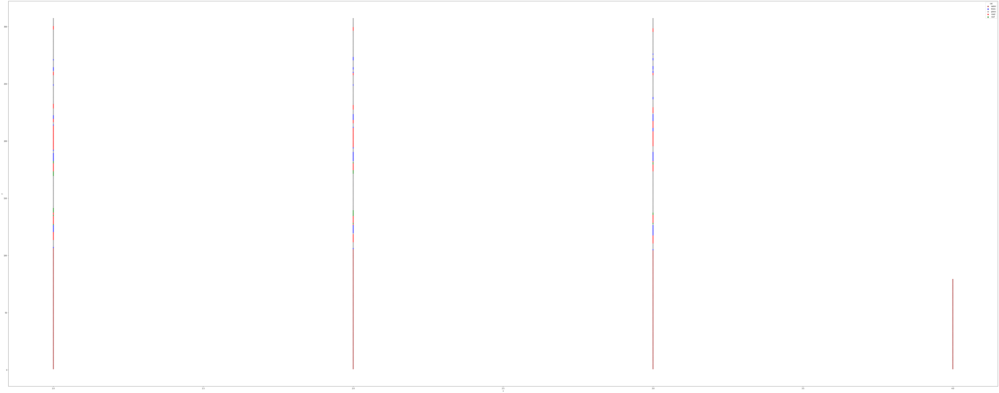

In [29]:
# customlabel = pd.DataFrame()
# customlabel.head()
# label2['cat'] = base_log_reg.predict(feature2).tolist()
pd.set_option('display.max_rows', 1000)
display(label2.head(1000))
plt.figure(figsize=(100,40))
sns.scatterplot(data=label2, x="x", y="y", hue="cat", palette=['brown','blue','grey','red','green'])

# customlabel = customlabel.merge(label2)
# customlabel.head(5)
# plt.figure(figsize=(100,40))
# sns.scatterplot(data=customlabel, x="x", y="y", hue="category", palette=['brown','blue','grey','red','green', 'black'])



In [30]:
np.log10(1/base_log_reg.C_)

array([1.57643205, 2.04309872, 2.50976539, 0.17643205, 2.97643205])

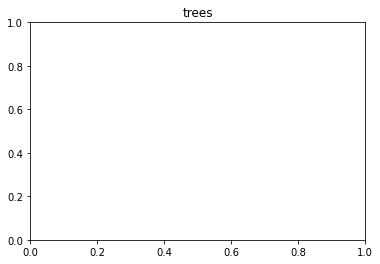

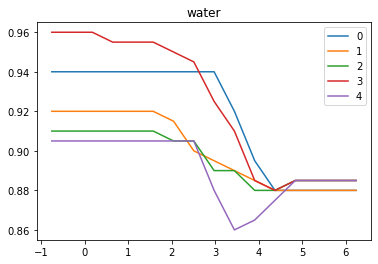

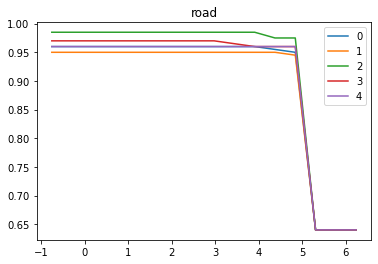

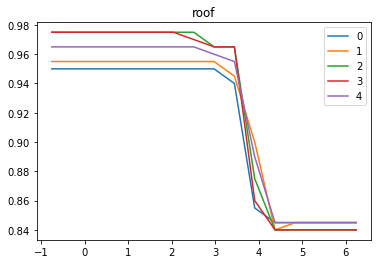

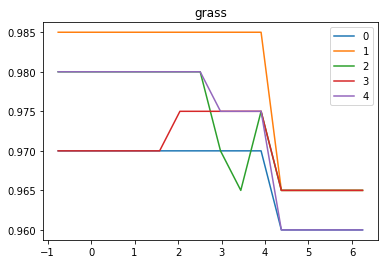

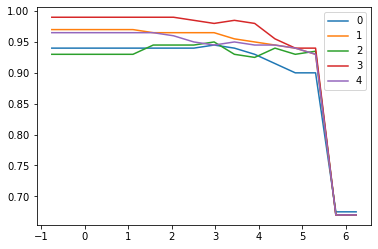

In [31]:
for mylabel in label2['category'].unique():
    plt.title(mylabel)
    pd.DataFrame(base_log_reg.scores_[mylabel].T, index=np.log10(1/(cs))).plot()

'trees'

'water'

'road'

'roof'

'grass'

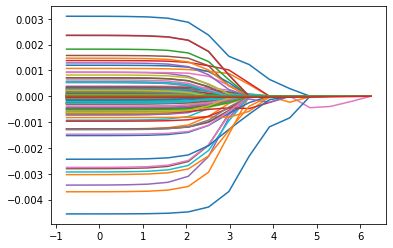

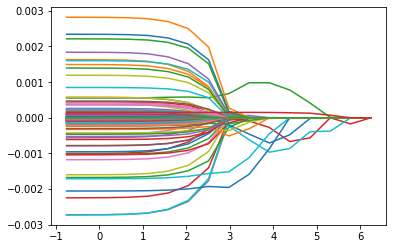

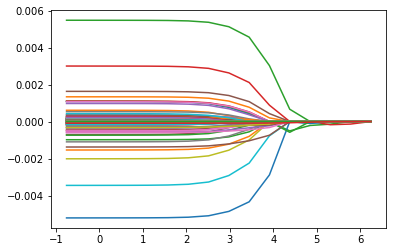

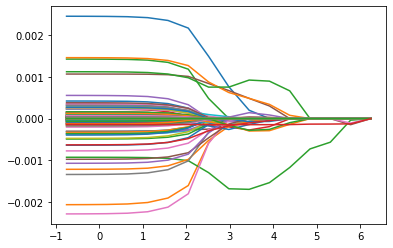

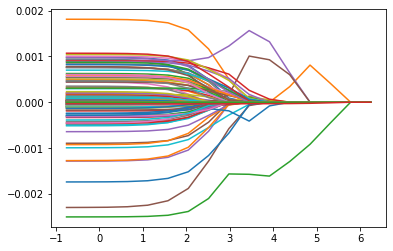

In [32]:
import time
for mylabel in label2['category'].unique():
    display(mylabel)
    pd.DataFrame(base_log_reg.coefs_paths_[mylabel].mean(axis=0), index=np.log10(1/(cs))).plot(legend=False)

<AxesSubplot:xlabel='x', ylabel='y'>

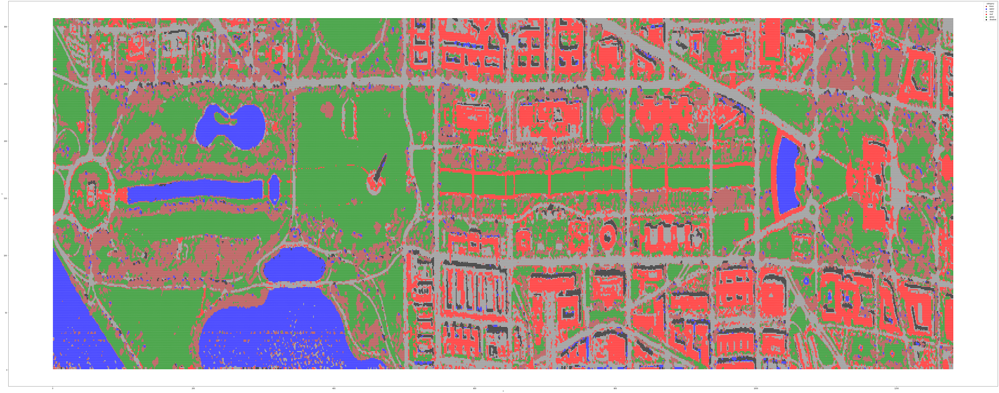

In [33]:
plt.figure(figsize=(100,40))
sns.scatterplot(data=label, x="x", y="y", hue="category", palette=['brown','blue','grey','red','green', 'black'])
